# Assignment 1 DSE 312 by Rakshith Vaishnavi Dogra 21218

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Importing the Image
**Resized the image, greyscaled and displayed it**

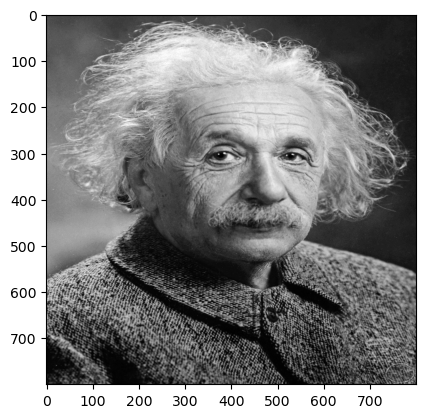

In [2]:
image = cv2.imread("Einstein.jpg")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray_image = cv2.resize(gray_image,(800, 800))
plt.gray()
plt.imshow(gray_image)
plt.show()

# Calculating the Size of Output Convoluted Image
**The Output image will be of size: Original_Image[x]  - (Kernal[x] - 1) X  Original_Image[y] - (Kernal[y] - 1)**

In [3]:
def calculate_output_size(image, kernal):
    sh = kernal.shape[0]
    pad = sh - 1 
    out = image.shape[0] - pad
    return out


# Implementing the Convolution Operation

In [4]:
def compute_conv(subset, kernal):
    con_s = 0
    for i in range(3):
        sum = 0
        for j in range(3):
            sum += subset[i][j] * kernal[i][j]
    con_s += sum
    return con_s


In [5]:
def convolve(image, kernal):
    k = kernal.shape[0]
    target_shape = calculate_output_size(image, kernal)
    con_img = np.zeros(shape = (target_shape, target_shape))
    for i in range(target_shape):
        for j in range(target_shape):
            mat = image[i : i + k, j : j + k]
            con_img[i][j] = np.sum(mat * kernal)
    return con_img

# Implementing the Filters

In [6]:
f1 = np.array([[0,0,0],
             [0, 1, 0],
             [0, 0, 0]])
f2 = np.array([[0, 0, 0],
              [0, 0, 1],
              [0, 0, 0]])
f3 = np.array([[0, 0, 0],
              [1, 0, 0],
              [0, 0, 0]])
f4 = np.array([[0, 0, 0],
              [0, 0, 0],
              [1, 0, 0]])
f5 = np.array([[0, 0, 1],
              [0, 0, 0],
              [0, 0, 0]])
q2_1 = np.array([[1, 0, -1],
                [2, 0 ,-2],
                [1, 0, -1]])
q2_2 = np.array([[1, 2, 1],
                 [0, 0, 0],
                 [-1, -2, -1]])


# Question 1

In [7]:
fim1 = convolve(gray_image, f1)
fim2 = convolve(gray_image, f2)
fim3 = convolve(gray_image, f3)
fim4 = convolve(gray_image, f4)
fim5 = convolve(gray_image, f5)

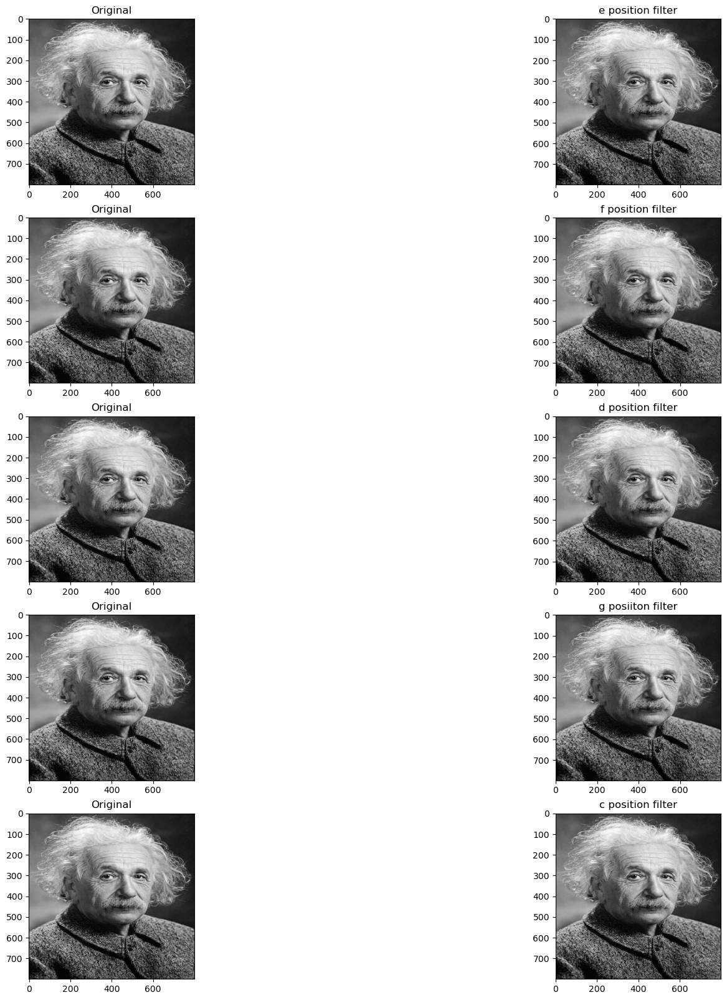

In [8]:
fig5 = plt.figure(figsize = (20, 20))
rows = 5
columns = 2

fig5.add_subplot(rows, columns, 1)
plt.imshow(gray_image)
plt.title("Original")

fig5.add_subplot(rows, columns, 2)
plt.imshow(fim1)
plt.title("e position filter")

fig5.add_subplot(rows, columns, 3)
plt.imshow(gray_image)
plt.title("Original")

fig5.add_subplot(rows, columns, 4)
plt.imshow(fim2)
plt.title("f position filter")

fig5.add_subplot(rows, columns, 5)
plt.imshow(gray_image)
plt.title("Original")

fig5.add_subplot(rows, columns, 6)
plt.imshow(fim3)
plt.title("d position filter")

fig5.add_subplot(rows, columns, 7)
plt.imshow(gray_image)
plt.title("Original")

fig5.add_subplot(rows, columns, 8)
plt.imshow(fim4)
plt.title("g posiiton filter")

fig5.add_subplot(rows, columns, 9)
plt.imshow(gray_image)
plt.title("Original")

fig5.add_subplot(rows, columns, 10)
plt.imshow(gray_image)
plt.title("c position filter")
plt.show()

**The diiference between the two images is not visible to the naked eye**
*butlike all the best things in life, we have to search for it*

> 1.The Size(shape) of the input and output Images differ

In [9]:
print("The shape of the original image is:", gray_image.shape)
print("The shape of the modified images are (f1, f2, f3, f4, f5): ",fim1.shape, fim2.shape, fim3.shape, fim4.shape, fim5.shape)

The shape of the original image is: (800, 800)
The shape of the modified images are (f1, f2, f3, f4, f5):  (798, 798) (798, 798) (798, 798) (798, 798) (798, 798)


> 2. By finding the difference between the original image and new image we can see shifting of the pixels

Preparing the Original Image by Making the shapes same


In [10]:
import pandas as pd
arr2d = np.array(gray_image)
df = pd.DataFrame(arr2d)
# df.head()
df = df.drop(0, axis = 0) #Delete first row
df = df.drop(0, axis = 1) #Delete first column
le = df.shape[0]
df = df.head(-1) #Delete last row
df = df.drop(columns = df.columns[-1])
df.shape

(798, 798)

In [11]:
fim_d1 = df - fim1
fim_d2 = df - fim2
fim_d3 = df - fim3
fim_d4 = df - fim4
fim_d5 = df - fim5

****Plotting the differences****

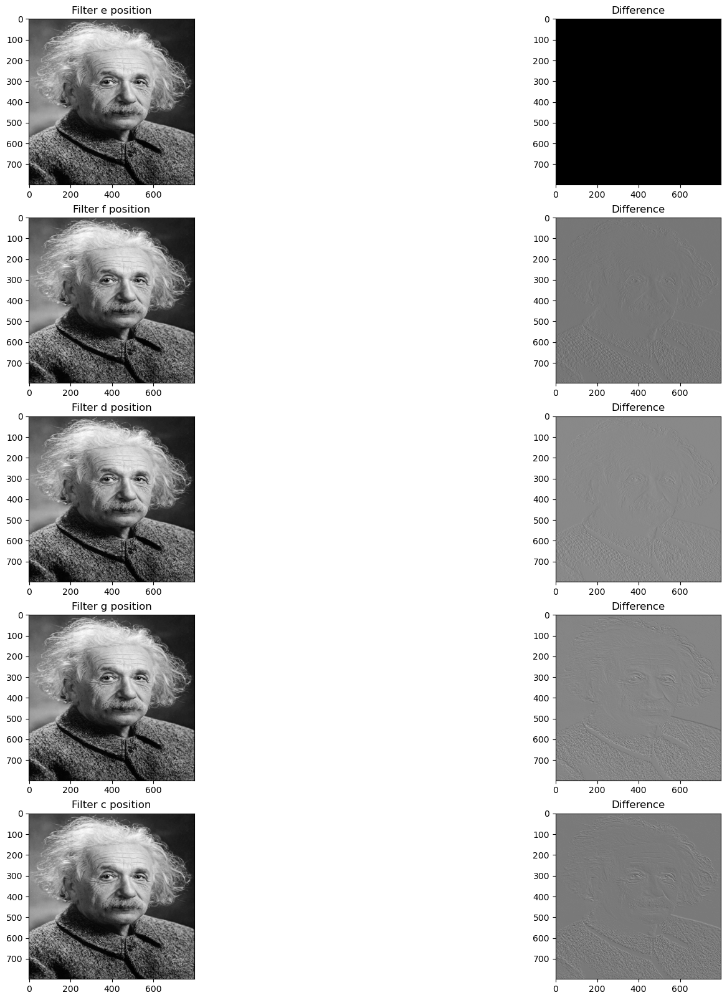

In [12]:
fig_d = plt.figure(figsize = (20, 20))
rows = 5
columns = 2
fig_d.add_subplot(rows, columns, 1)
plt.imshow(fim1)
plt.title("Filter e position")

fig_d.add_subplot(rows, columns, 2)
plt.imshow(fim_d1)
plt.title("Difference")

fig_d.add_subplot(rows, columns, 3)
plt.imshow(fim2)
plt.title("Filter f position")

fig_d.add_subplot(rows, columns, 4)
plt.imshow(fim_d2)
plt.title("Difference")

fig_d.add_subplot(rows, columns, 5)
plt.imshow(fim3)
plt.title("Filter d position")

fig_d.add_subplot(rows, columns, 6)
plt.imshow(fim_d3)
plt.title("Difference")

fig_d.add_subplot(rows, columns, 7)
plt.imshow(fim4)
plt.title("Filter g position")

fig_d.add_subplot(rows, columns, 8)
plt.imshow(fim_d4)
plt.title("Difference")

fig_d.add_subplot(rows, columns, 9)
plt.imshow(fim5)
plt.title("Filter c position")

fig_d.add_subplot(rows, columns, 10)
plt.imshow(fim_d5)
plt.title("Difference")

plt.show()

# Question 2

In [13]:
img1 = convolve(gray_image, q2_1)
img2 = convolve(gray_image, q2_2)


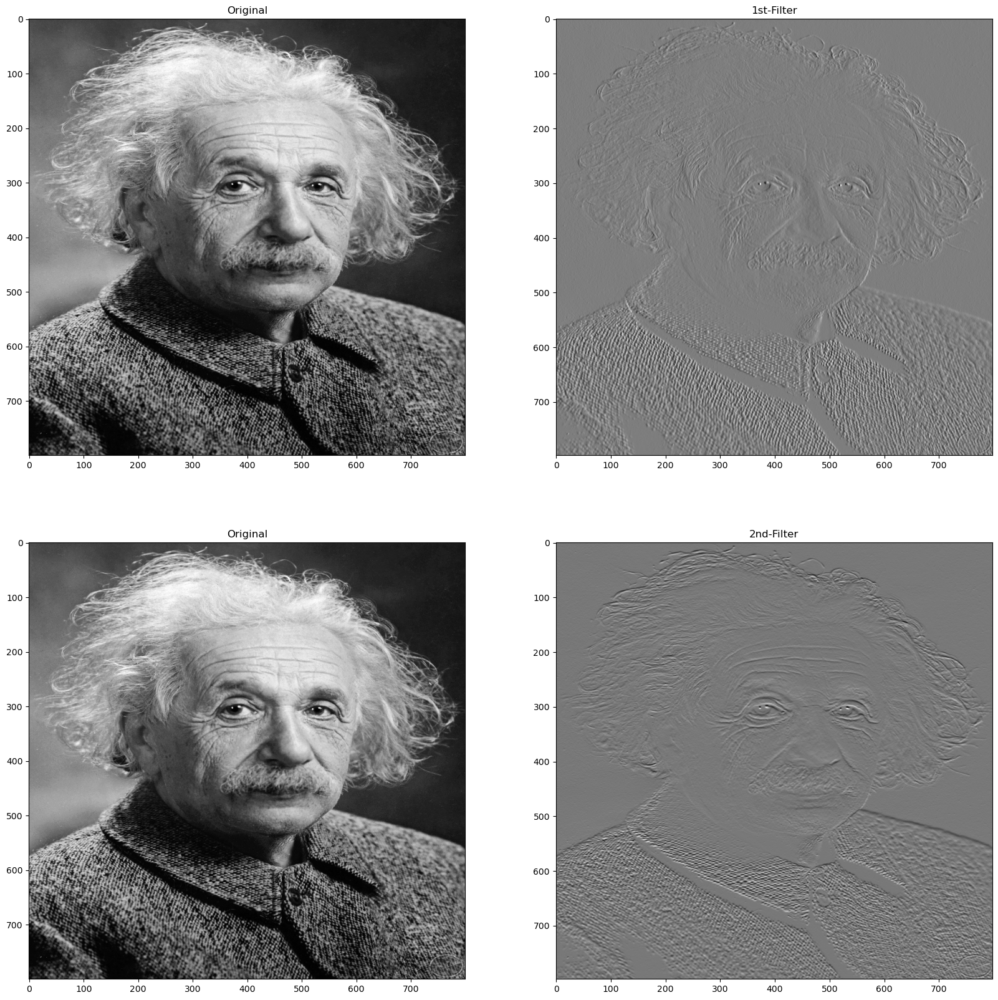

In [14]:
rows = 2
columns = 2
fig= plt.figure(figsize = (20, 20))
fig.add_subplot(rows, columns, 1)
plt.imshow(gray_image)
plt.title("Original")

fig.add_subplot(rows, columns, 2)
plt.imshow(img1)
plt.title("1st-Filter")

fig.add_subplot(rows, columns, 3)
plt.imshow(gray_image)
plt.title("Original")

fig.add_subplot(rows, columns, 4)
plt.imshow(img2)
plt.title("2nd-Filter")

plt.show()

# Question 3
**Adding Average Filter**

In [15]:
#Declaring the average filter
fil_average = np.array([[1/9, 1/9, 1/9],
                       [1/9, 1/9, 1/9],
                       [1/9, 1/9, 1/9]])

In [16]:

im_av = convolve(gray_image, fil_average)

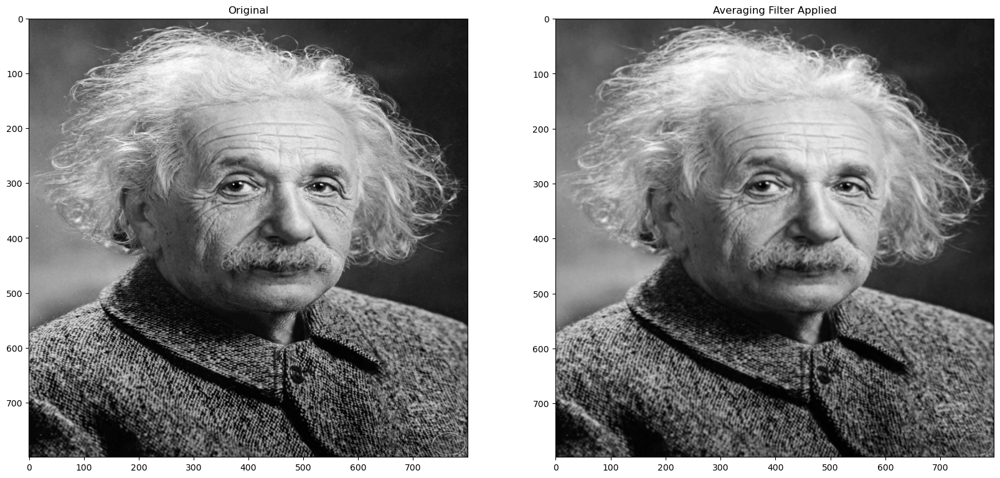

In [17]:
fig1= plt.figure(figsize = (20, 20))
rows = 1
columns = 2
fig1.add_subplot(rows, columns, 1)
plt.imshow(gray_image)
plt.title("Original")

fig1.add_subplot(rows, columns, 2)
plt.imshow(im_av)
plt.title("Averaging Filter Applied")
plt.show()

**Adding Gaussian Filter**
> https://www.researchgate.net/figure/Discrete-approximation-of-the-Gaussian-kernels-3x3-5x5-7x7_fig2_325768087

In [18]:
fil_gaussian = np.array([[1/16, 1/8, 1/16],
                        [1/8, 1/4, 1/8],
                        [1/16, 1/8, 1/16]])

In [19]:
im_gau = convolve(gray_image, fil_gaussian)

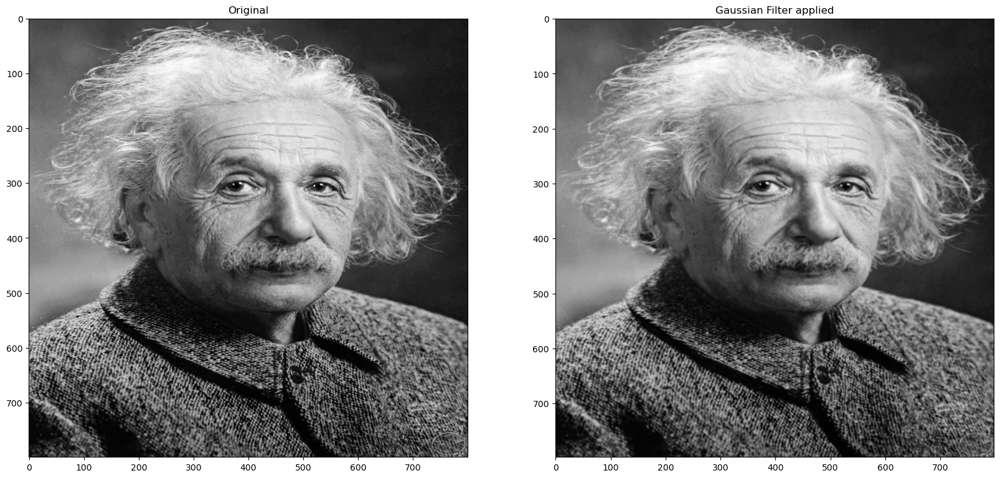

In [20]:
fig3= plt.figure(figsize = (20, 20))
rows = 1
columns = 2
fig3.add_subplot(rows, columns, 1)
plt.imshow(gray_image)
plt.title("Original")

fig3.add_subplot(rows, columns, 2)
plt.imshow(im_gau)
plt.title("Gaussian Filter applied")
plt.show()

# Making difference more visible

[[[196 186 162]
  [243 235 212]
  [255 255 236]
  ...
  [255 251 250]
  [248 241 238]
  [238 231 228]]

 [[192 182 164]
  [249 239 222]
  [255 255 245]
  ...
  [255 251 248]
  [251 246 243]
  [246 242 237]]

 [[171 159 153]
  [238 227 223]
  [255 253 250]
  ...
  [255 255 247]
  [255 253 245]
  [251 249 241]]

 ...

 [[255 251 252]
  [250 248 248]
  [245 246 244]
  ...
  [249 249 243]
  [247 247 241]
  [246 247 238]]

 [[254 254 254]
  [249 251 251]
  [244 249 248]
  ...
  [249 251 245]
  [249 251 245]
  [249 251 245]]

 [[244 246 246]
  [246 251 250]
  [248 254 253]
  ...
  [239 243 238]
  [242 244 238]
  [242 244 238]]]


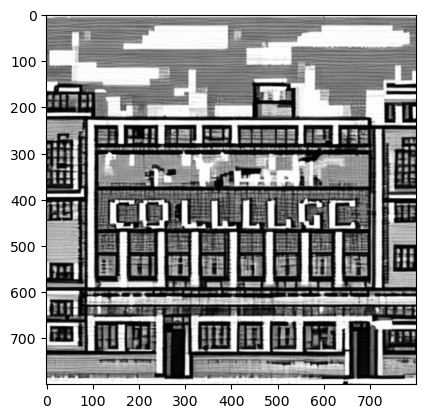

In [24]:
im = cv2.imread("download.jpeg")
gray_ima = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
gray_ima = cv2.resize(gray_ima,(800, 800))
plt.gray()
plt.imshow(gray_ima)
plt.show()

In [25]:
fim1 = convolve(gray_ima, f1)
fim2 = convolve(gray_ima, f2)
fim3 = convolve(gray_ima, f3)
fim4 = convolve(gray_ima, f4)
fim5 = convolve(gray_ima, f5)

In [26]:
import pandas as pd
arr2d = np.array(gray_ima)
df = pd.DataFrame(arr2d)
# df.head()
df = df.drop(0, axis = 0) #Delete first row
df = df.drop(0, axis = 1) #Delete first column
le = df.shape[0]
df = df.head(-1) #Delete last row
df = df.drop(columns = df.columns[-1])
df.shape

(798, 798)

In [27]:
fim_d1 = df - fim1
fim_d2 = df - fim2
fim_d3 = df - fim3
fim_d4 = df - fim4
fim_d5 = df - fim5

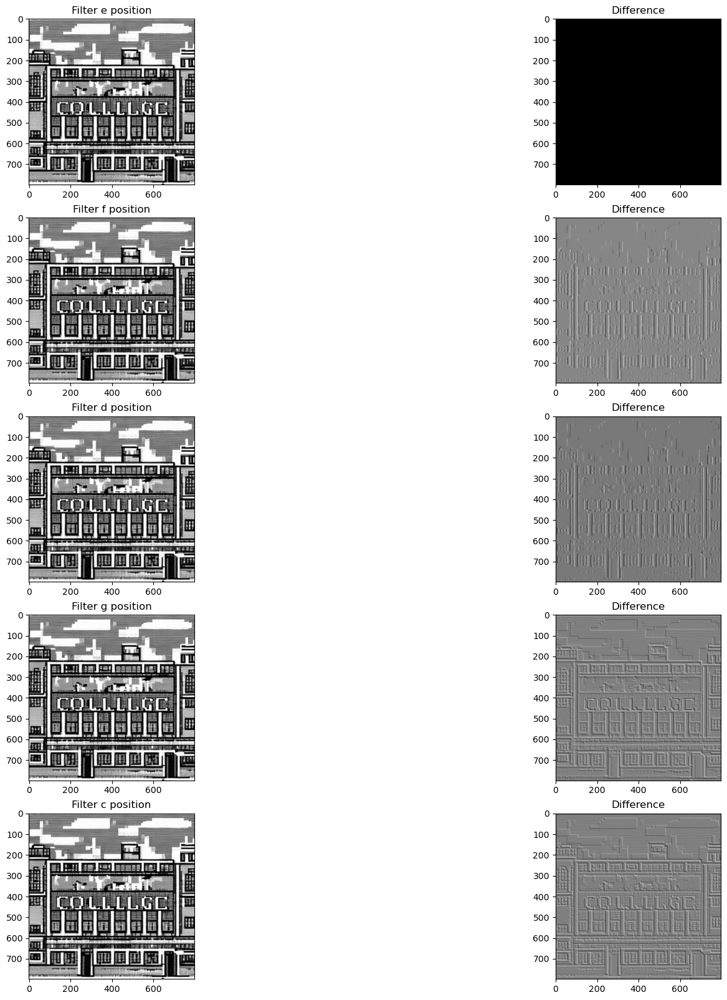

In [28]:
fig_d = plt.figure(figsize = (20, 20))
rows = 5
columns = 2
fig_d.add_subplot(rows, columns, 1)
plt.imshow(fim1)
plt.title("Filter e position")

fig_d.add_subplot(rows, columns, 2)
plt.imshow(fim_d1)
plt.title("Difference")

fig_d.add_subplot(rows, columns, 3)
plt.imshow(fim2)
plt.title("Filter f position")

fig_d.add_subplot(rows, columns, 4)
plt.imshow(fim_d2)
plt.title("Difference")

fig_d.add_subplot(rows, columns, 5)
plt.imshow(fim3)
plt.title("Filter d position")

fig_d.add_subplot(rows, columns, 6)
plt.imshow(fim_d3)
plt.title("Difference")

fig_d.add_subplot(rows, columns, 7)
plt.imshow(fim4)
plt.title("Filter g position")

fig_d.add_subplot(rows, columns, 8)
plt.imshow(fim_d4)
plt.title("Difference")

fig_d.add_subplot(rows, columns, 9)
plt.imshow(fim5)
plt.title("Filter c position")

fig_d.add_subplot(rows, columns, 10)
plt.imshow(fim_d5)
plt.title("Difference")

plt.show()